In [1]:
import numpy as np
import pandas as pd
import networkx as nx
from IPython.display import Image

# LUCAS0 "unbiased" test set generation

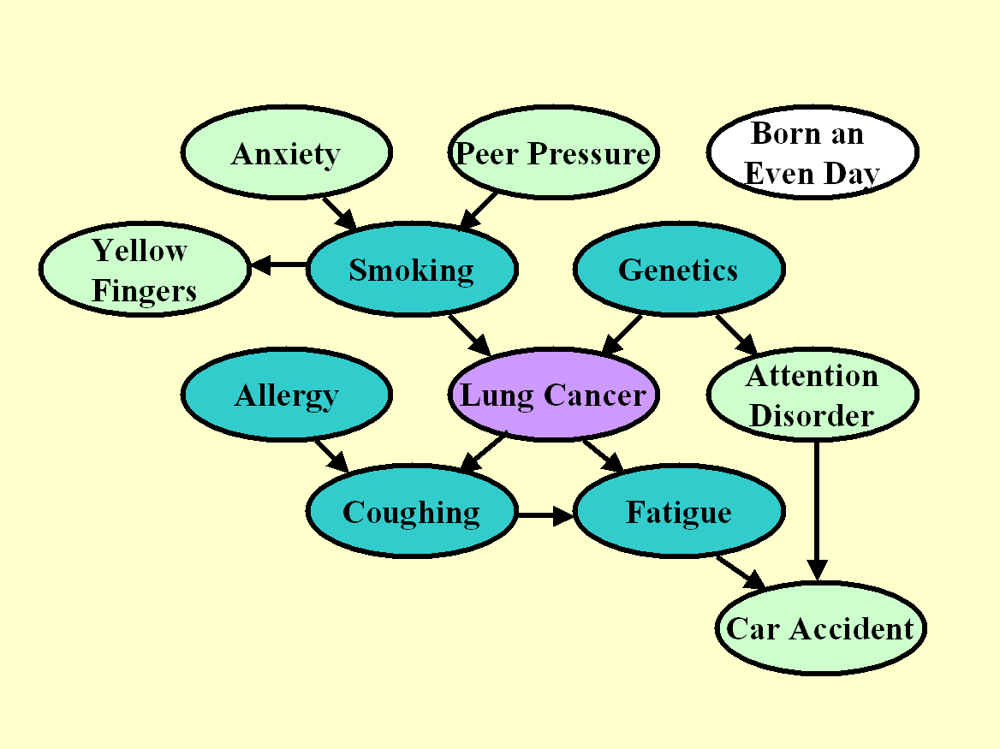

In [2]:
Image(filename="img/lucas0_causal_graph.gif")

In [3]:
attributes = [
    "anxiety",
    "peer pressure",
    "yellow fingers",
    "smoking",
    "genetics",
    "allergy",
    "lung cancer",
    "attention disorder",
    "coughing",
    "fatigue",
    "car accident"
]   

In [4]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.4),
    (2, 4, 0.6),
    (4, 3, 1),
    (4, 7, 0.6),
    (5, 7, 0.4),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8)
])

In [5]:
from datagen import DataGenerator

g = DataGenerator(causalgraph, 11)

In [6]:
data = g.generate(10000)
df = pd.DataFrame(columns=attributes, data=data)
df

,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident
0,0.836889,-0.836950,-0.020085,-0.079684,1.305147,-1.018535,0.482498,1.364938,-0.558860,-0.006817,0.281597
1,0.968124,-0.029463,0.315481,0.340711,0.557522,-0.056992,0.443372,0.530634,0.156963,0.288525,0.289694
2,1.028526,0.920689,0.922470,0.938381,0.873570,0.066756,0.893594,0.845202,0.347479,0.662015,0.634063
3,-0.649633,-1.725176,-1.277896,-1.251130,-0.825927,1.667988,-1.108144,-0.775018,0.826147,-0.401587,-0.441145
4,-0.012726,0.281068,0.134109,0.183759,-0.836478,0.147970,-0.183960,-0.847902,-0.020300,-0.059179,-0.280185
...,...,...,...,...,...,...,...,...,...,...,...
9995,1.086037,-0.205061,0.331146,0.267217,1.766002,-0.221919,0.797792,1.757110,0.081158,0.547431,0.755488
9996,-1.705810,-0.612092,-1.041992,-1.079893,1.351019,-1.229942,-0.139206,1.364616,-0.933032,-0.484449,-0.109584
9997,-0.132267,0.122596,0.073535,0.093042,-1.460084,0.295387,-0.502566,-1.480699,0.076648,-0.249168,-0.499358
9998,0.901058,-0.667950,-0.061267,-0.081746,-0.392796,-0.646688,-0.199932,-0.385710,-0.537213,-0.323245,-0.269534


[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0 

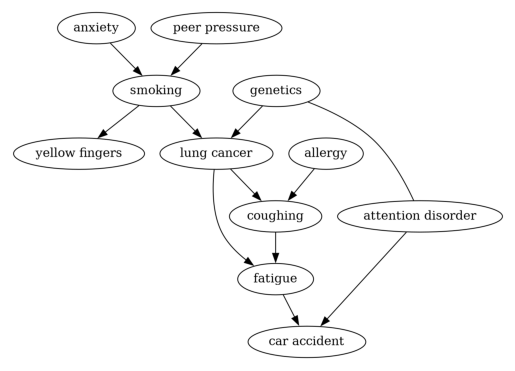

In [7]:
from causallearn.search.ScoreBased.GES import ges
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

# Test set visualization

## General pairplot

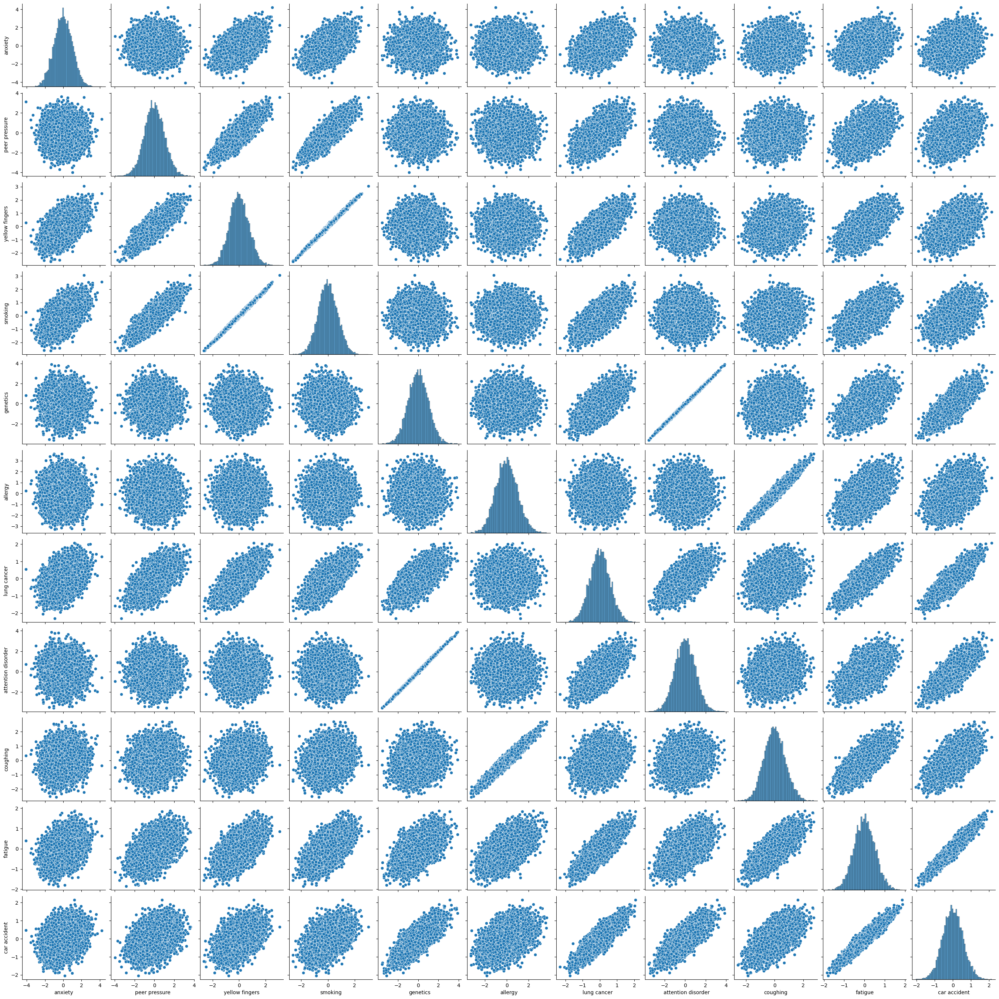

In [8]:
import seaborn
# seaborn.pairplot(df)
Image(filename="img/lucas0_test_pairplots.png")

## Focused pairplot

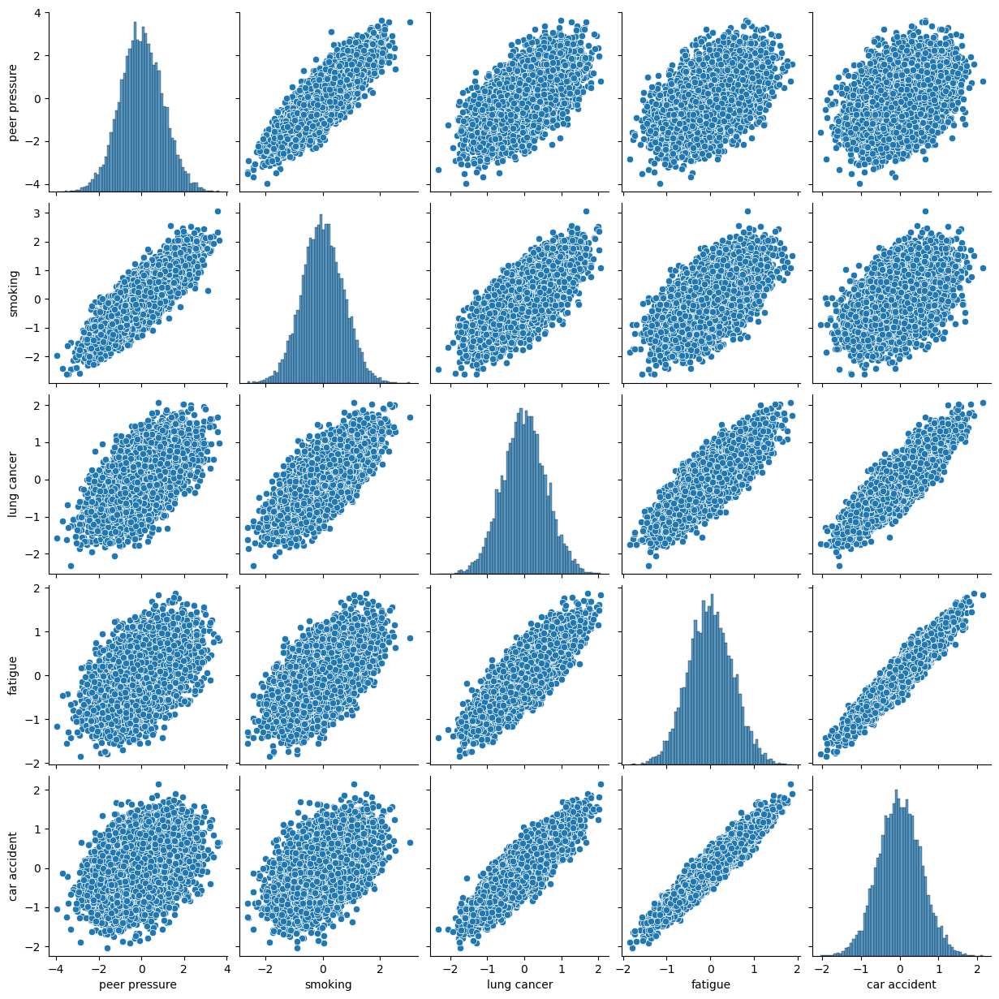

In [9]:
# seaborn.pairplot(df, vars=["peer pressure", "smoking", "lung cancer", "fatigue", "car accident"])
Image(filename="img/lucas0_test_pairplots_focused.png")

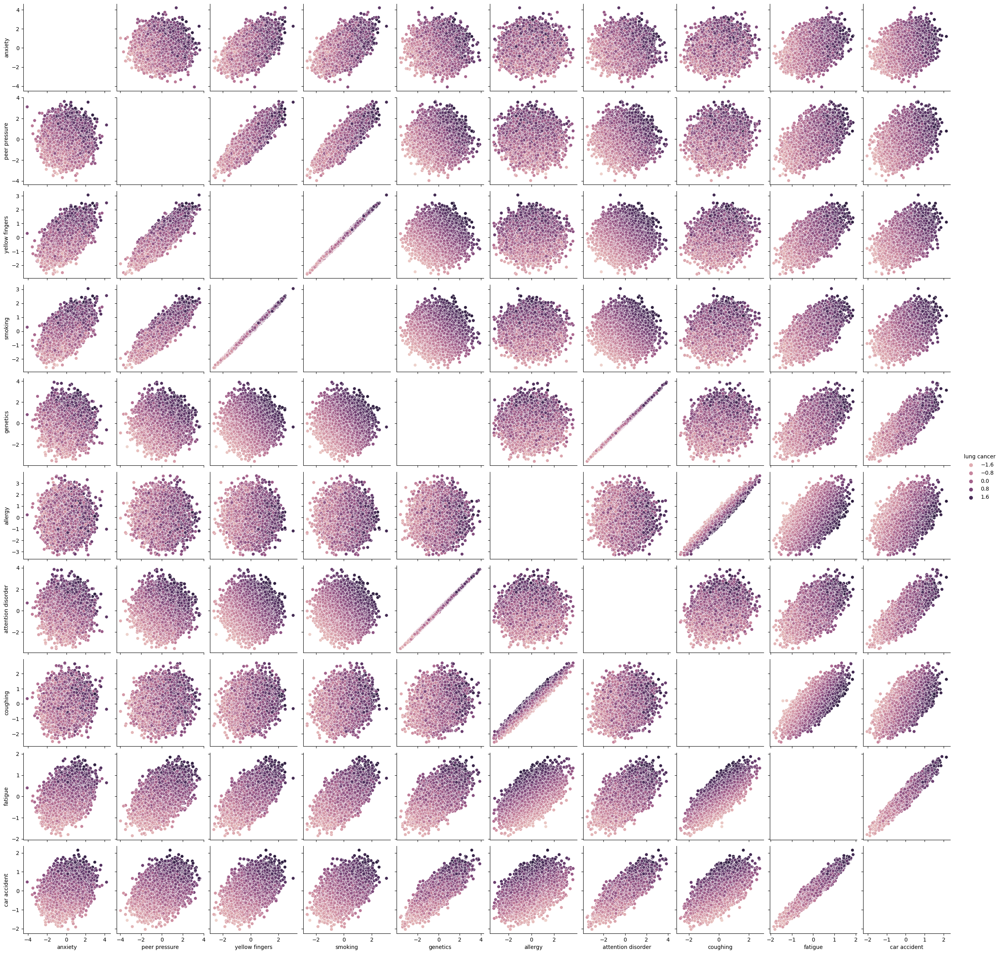

In [10]:
Image(filename="img/lucas0_test_pairplots_hued.png")

# Spurious relationships

## Birth mortality example

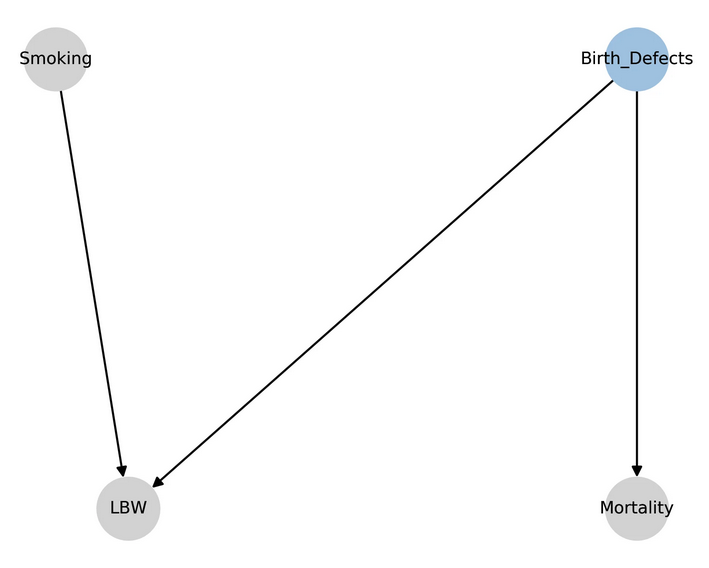

In [11]:
Image(filename="img/spurious.png")

According to this graph, if a baby is born with low birth weight, it is because of a combination of the mother smoking and genetic defects. That means that if the mother didn't smoke, it is 100% genetic defects, and vice versa. If we condition on LWB, that induces a new *spurious* negative correlation between smoking and birth defects, as if low birth weight is true, then the higher "Smoking" the lower "Birth_Defects" and vice versa.

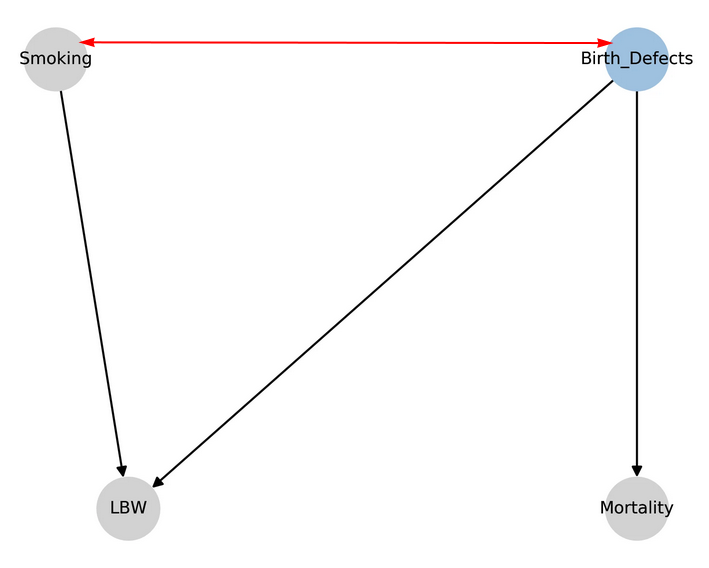

In [12]:
Image(filename="img/spurious2.png")

So now the higher the smoking, the lower the birth defects, and since mortality is positively correlated with birth defects and not with smoking, then the lower the mortality.

It is possible to reproduce this scenario in the LUCAS0 causal graph.
- Lung cancer is caused by Smoking and Genetics
- If we condition on Lung Cancer, there's a negative correlation between Lung Cancer and Genetics
- Genetics also cause Attention Disorder
- So the lower the smoking, the higher the attention disorder.

## Adding a genetic factor as smoking/lung cancer cofounder

In [13]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.2),
    (2, 4, 0.4),
    (4, 3, 1),
    (4, 7, 0.3),
    (5, 7, 0.3),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8),
    (12, 4, 0.4),
    (12, 7, 0.4)
])

attributes2 = attributes+["genetic2"]

In [14]:
g = DataGenerator(causalgraph, 12)
data = g.generate(10000)
# data = np.delete(data, 11, axis=1)
df = pd.DataFrame(columns=attributes2, data=data)
df


,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident,genetic2
0,-0.116321,0.344872,-0.091888,-0.142041,-0.534128,-0.635220,-0.565356,-0.529710,-0.640684,-0.614373,-0.642915,-0.869217
1,2.314751,0.575764,0.928450,0.973566,0.878978,0.600739,0.887907,0.852935,0.719513,0.906596,0.927833,0.685795
2,-0.284073,0.598963,-0.416425,-0.392910,-0.921721,-0.720696,-0.984592,-0.917355,-0.811243,-0.921813,-0.924108,-1.315451
3,2.182846,0.491228,0.704743,0.655675,-0.540056,-0.635670,0.001653,-0.526327,-0.476687,-0.216568,-0.279652,-0.046753
4,0.845936,-1.265411,0.312807,0.292534,0.207465,1.285527,0.832106,0.187893,1.145785,1.028012,0.834733,1.577787
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.013583,-1.951445,-1.288659,-1.239881,1.786126,-1.058070,-0.073237,1.767894,-0.694847,-0.347413,0.143891,-0.586210
9996,-0.919056,-1.844101,-0.430414,-0.377783,-1.254847,0.845857,0.014324,-1.298869,0.589319,0.284347,-0.052774,1.410938
9997,-0.887304,-0.276567,-0.132431,-0.168227,0.775784,0.618857,0.281942,0.718142,0.528057,0.348991,0.503145,0.245283
9998,-0.557556,0.145338,-0.141679,-0.074617,-0.088501,-1.402243,-0.082432,-0.035205,-1.088046,-0.466329,-0.383215,-0.025986


### Providing the extra attribute

[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 

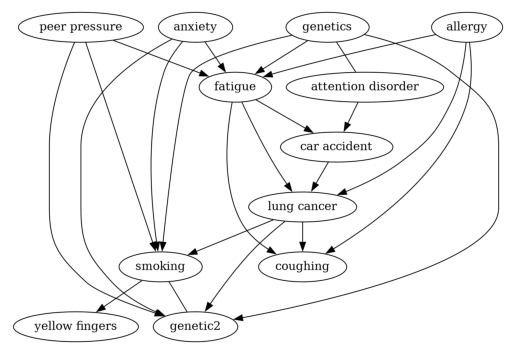

In [15]:
res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes2)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

### Hiding the extra attribute

[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0 

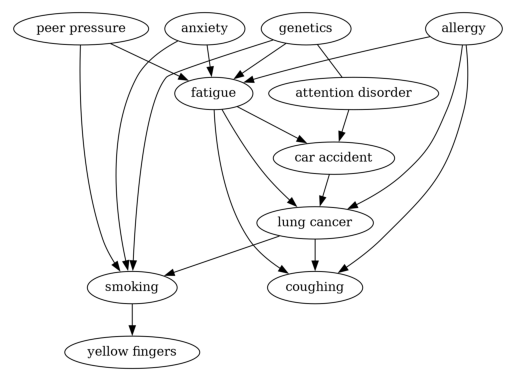

In [16]:
data = np.delete(data, 11, axis=1)
df = pd.DataFrame(columns=attributes, data=data)
res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

### Comparing pairplots

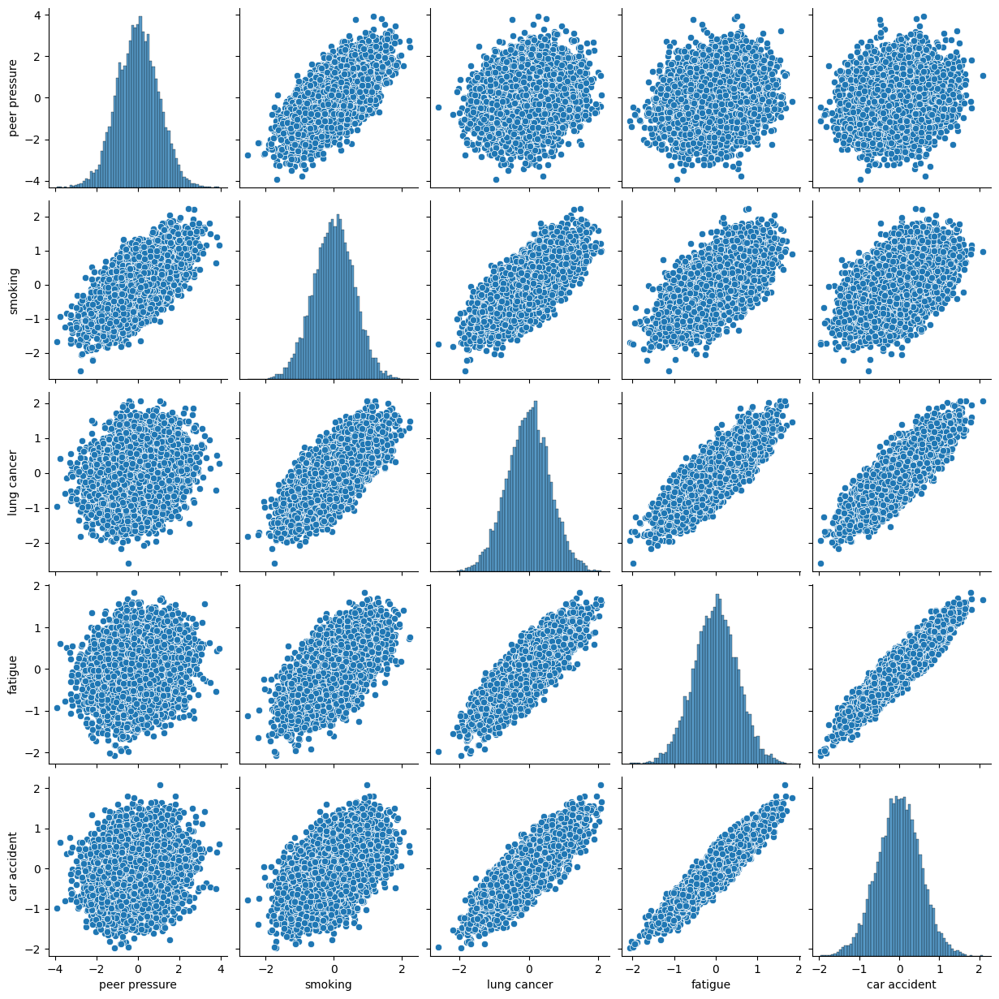

In [17]:
seaborn.pairplot(df, vars=["peer pressure", "smoking", "lung cancer", "fatigue", "car accident"])

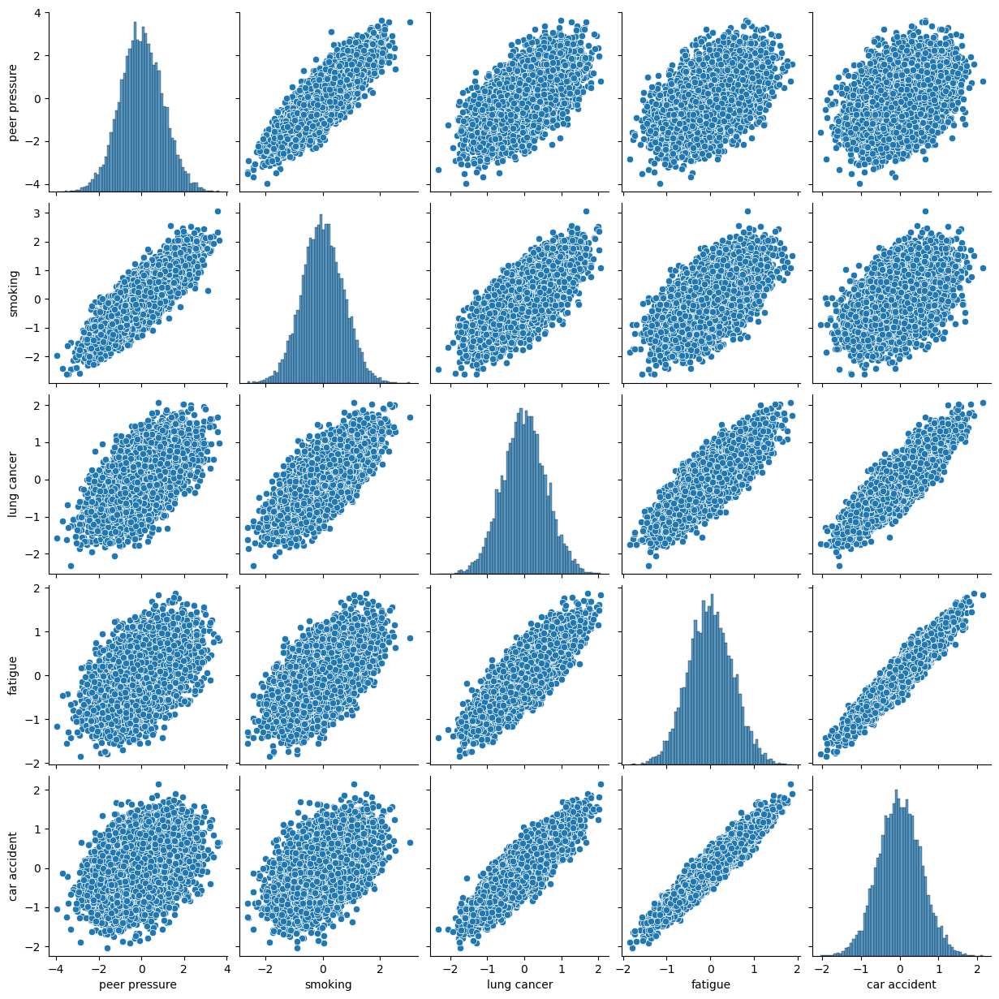

In [18]:
Image(filename="img/lucas0_test_pairplots_focused.png")

## Differently calibrated machines at 2 different hospitals

Here, we imagine that the data comes 50/50 from 2 different hospitals with different calibrations for an instrument that "measure genetics". We add two parent nodes for genetics, Hospital 1 and Hospital 2, however Hostpital 2 is generated using *N*(3, 0.8) instead of *N*(0,1).

In [19]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.2),
    (2, 4, 0.4),
    (4, 3, 1),
    (4, 7, 0.3),
    (5, 7, 0.3),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8),
])

In [20]:
g = DataGenerator(causalgraph, 11)
g.set_sample_func(5, lambda: np.random.normal() if np.random.random()>0.5 else np.random.normal(3, 0.8))
data = g.generate(10000)
df = pd.DataFrame(columns=attributes, data=data)
df

,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident
0,1.226993,0.074851,0.091859,0.187027,3.450421,-1.112653,1.054151,3.441874,-0.442204,0.442026,1.023293
1,-0.942568,1.074441,0.307701,0.262434,2.658548,-0.063149,0.926756,2.611826,0.305151,0.681393,1.092295
2,0.185042,0.910098,0.429518,0.447332,3.353718,-0.448297,1.037782,3.394082,-0.041023,0.606548,1.108809
3,1.779791,0.616520,0.557095,0.610374,0.094913,-0.693138,0.239414,0.071589,-0.384656,0.010012,0.060269
4,1.136417,1.285377,0.799687,0.804855,0.374340,-0.855809,0.383165,0.404365,-0.508406,0.053453,0.030638
...,...,...,...,...,...,...,...,...,...,...,...
9995,1.752023,0.736296,0.765361,0.759910,4.461540,1.385788,1.493418,4.462775,1.341879,1.458390,2.101598
9996,-1.959757,-0.128918,-0.353787,-0.391590,2.628821,1.016860,0.616067,2.725201,0.839091,0.724351,1.160776
9997,0.253140,1.659902,0.784804,0.759153,2.850716,-0.649632,1.077631,2.806562,-0.123773,0.653097,1.161817
9998,0.408039,2.183989,0.963672,0.947653,3.605911,-2.279207,1.352712,3.589262,-1.158390,0.381505,1.041903


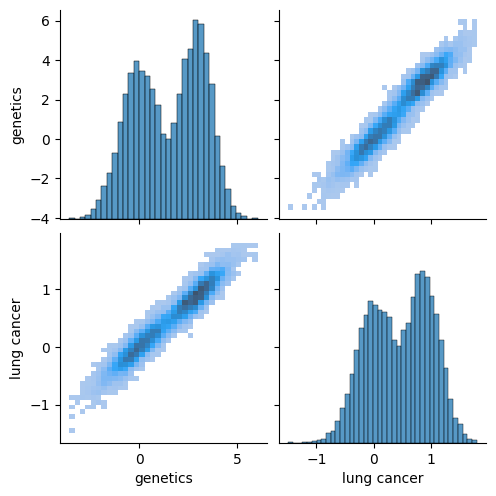

In [21]:
seaborn.pairplot(df, vars=["genetics", "lung cancer"], kind="hist")

## Making lung cancer binary

In [33]:
def lung_cancer(dataline, preds):
    val = 0
    for edge in preds:
        val += dataline[edge[0]-1] * edge[2]["weight"]
    return np.round(1 / ( 1 + np.exp(-500*val)))

g = DataGenerator(causalgraph, 11)
g.set_child_func(7, lung_cancer)
data = g.generate(10000)
df = pd.DataFrame(columns=attributes, data=data)
df


,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident
0,-1.399017,-0.377331,-0.501355,-0.418873,0.364870,-1.682915,0.0,0.288286,-1.180473,-0.433029,-0.291334
1,-0.255343,-0.934536,-0.452501,-0.415406,0.510407,0.507128,1.0,0.470117,0.608781,0.800650,0.791867
2,-1.796677,0.991854,0.107798,0.035458,-0.275349,-0.442883,0.0,-0.259242,-0.377289,-0.175031,-0.204925
3,0.810768,1.937642,0.994927,0.967640,0.516687,-0.839307,1.0,0.509418,-0.309465,0.453999,0.492485
4,0.481218,-1.057474,-0.451604,-0.426308,1.728998,-1.219177,1.0,1.700635,-0.558768,0.336818,0.556272
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.290107,-0.252776,0.029240,0.022510,0.371607,-1.051900,1.0,0.406974,-0.425661,0.440415,0.465732
9996,0.501773,0.646920,0.471654,0.412235,-0.050982,-1.239132,1.0,-0.144053,-0.613237,0.372471,0.310974
9997,1.362522,-0.232085,0.257412,0.184481,1.648881,0.741451,1.0,1.681122,0.767254,0.913103,1.122295
9998,0.223024,2.623469,1.103772,1.121417,-1.491257,-0.388298,0.0,-1.558083,-0.259722,-0.086330,-0.362817


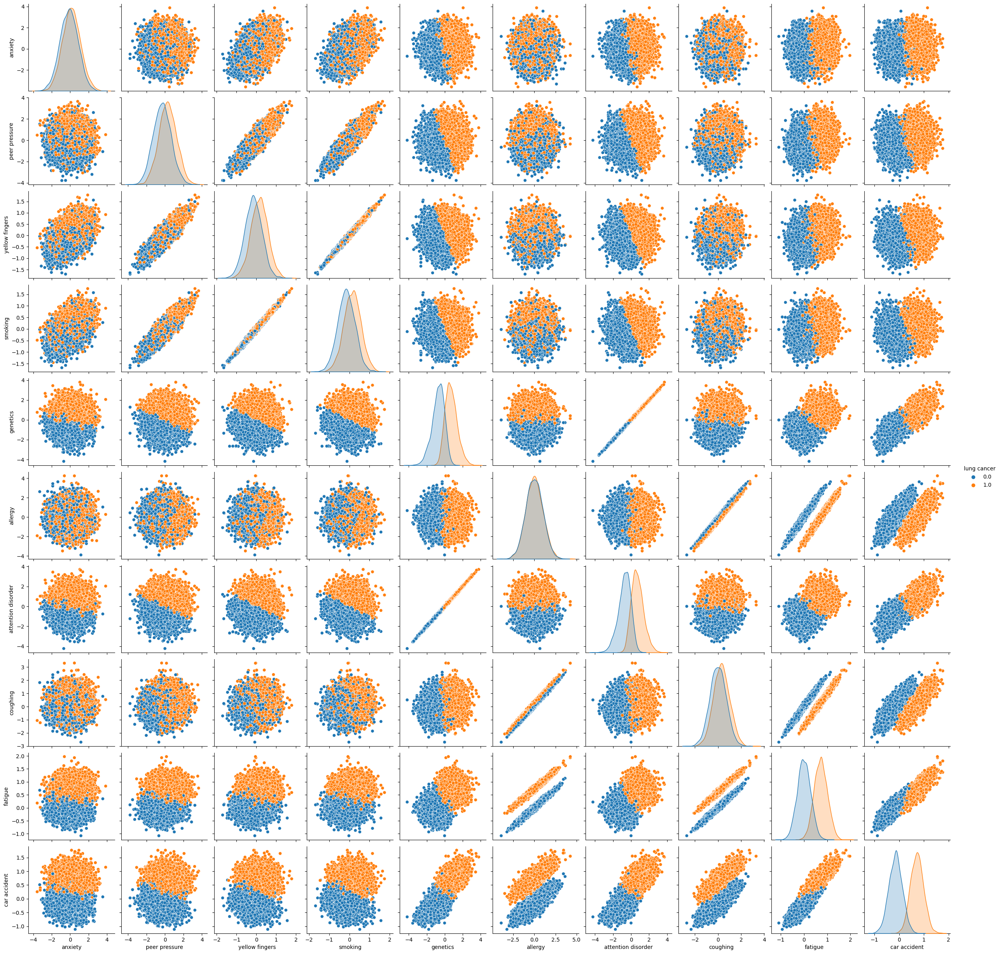

In [34]:
seaborn.pairplot(df, hue="lung cancer")

[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0 

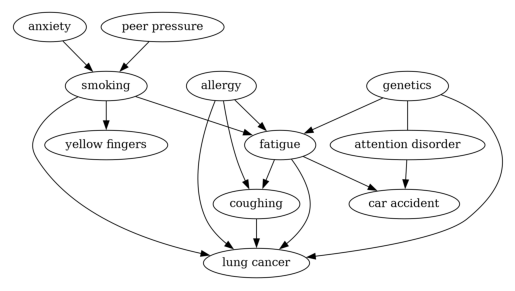

In [77]:
res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

In [78]:
from causallearn.search.ScoreBased.ExactSearch import bic_exact_search
res = bic_exact_search(data)

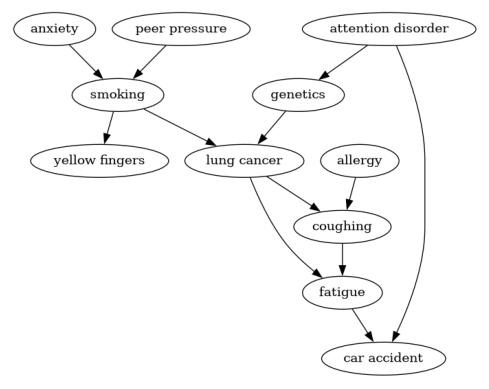

In [79]:
g = nx.from_numpy_array(res[0], create_using=nx.DiGraph)
mapping = {x : attributes[x] for x in range(11)}
nx.relabel_nodes(g, mapping, copy=False)
pyd = nx.nx_pydot.to_pydot(g)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

## Inducing sampling bias